# Figure 7: Illustration of differences for C-SALE relative to classic ALE

Note: This notebook must be run on a machine with Nvidia GPUs

In [1]:
import os
import sys
import nimare
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns
from nilearn import plotting
import nilearn.maskers
import nilearn.image
import nilearn.surface
import nibabel
import itertools
import scipy
from tqdm import tqdm
import nimare_gpu
import SUITPy.flatmap
import scipy.cluster.hierarchy as sch
from nimare_gpu.ale import DeviceSCALE, DeviceALE
from nimare_gpu.stats import nullhist_to_p
from nimare.utils import mm2vox, vox2mm
from itertools import cycle
import warnings
warnings.filterwarnings("ignore")

# Define base directory of the project which is the parent of scripts folder
BASE_DIR = os.path.abspath('../..')
sys.path.append(os.path.join(BASE_DIR, 'scripts'))

import utils

# Defines input and output paths.
INPUT_DIR = os.path.join(BASE_DIR, 'input')
OUTPUT_DIR = os.path.join(BASE_DIR, 'output')
# create figures directory
FIGURES_DIR = os.path.join(BASE_DIR, 'Figures')
figure_dir = os.path.join(FIGURES_DIR, 'Figure7')
supplementary_dir = os.path.join(figure_dir, 'Supplementary')
os.makedirs(supplementary_dir, exist_ok=True)

# Set up font style
plt.rcParams["font.family"] = "Asana Math"
plt.rcParams["font.size"] = 14
plt.rcParams["figure.dpi"] = 300

## Load data

We will use the working memory subdomain as example. This is because it 1. is interesting to us; 2. has results for all the analyses; 3. and crucially, it converges in regions with high numbers of foci (in the baseline) illustrating well how C-SALE accounts for this to appropriately assign significance to voxels.

In [2]:
dset = nimare.dataset.Dataset.load(os.path.join(OUTPUT_DIR, 'data', 'Cognition', 'Cognition.Memory.Working', 'dset.pkl.gz'))
dset

Dataset(113 experiments, space='mni152_2mm')

## ALE Map Calculation

Run ALE without permutations to calculate the ALE map:

In [3]:
MASK_NAME = 'D2009_MNI_dilated-6mm'
mask_img = nibabel.load(os.path.join(INPUT_DIR, 'maps', f'{MASK_NAME}.nii.gz'))
mask = nilearn.maskers.NiftiMasker(mask_img)

ale = DeviceALE(
    mask=mask, 
    nbits=64,
    null_method='approximate',
)
ale_res = ale.fit(dset)

### Foci

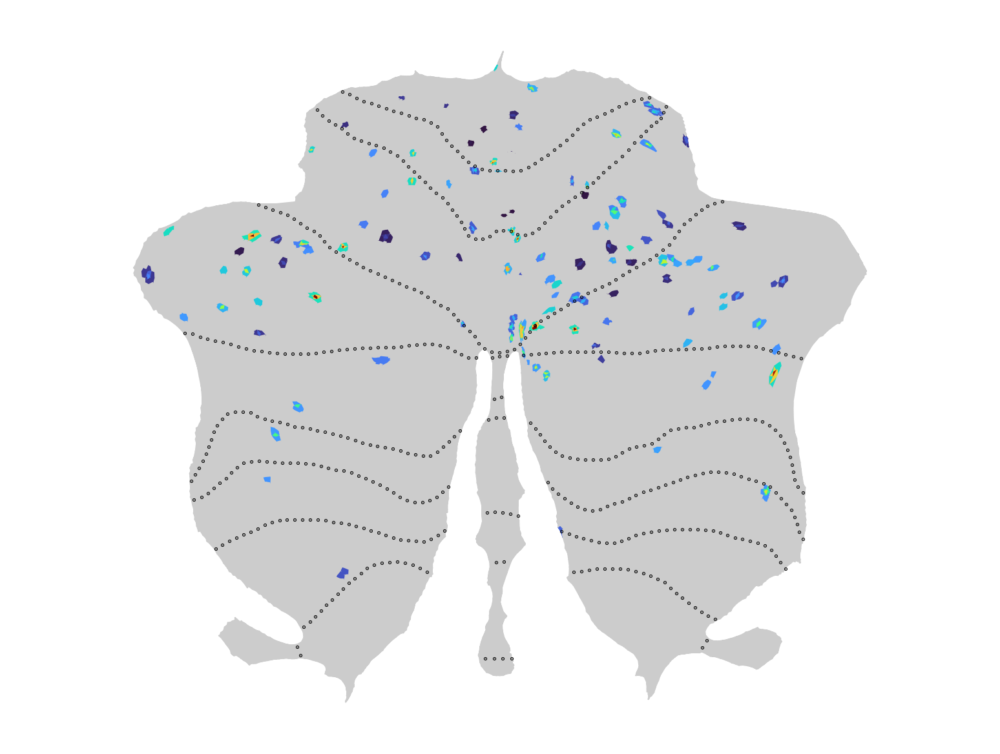

In [22]:
# create a nifti image with each voxel including a focus
# set to its originating experiment ID
xyz = dset.coordinates[['x', 'y', 'z']].values
ijk = mm2vox(xyz, mask_img.affine)
foci_img_data = np.zeros(mask_img.shape)
foci_img_data[ijk[:,0], ijk[:, 1], ijk[:, 2]]  = dset.coordinates['id'].astype('category').cat.codes.values + 1 # set the values to exp IDs [1, 113]
foci_img = nilearn.image.new_img_like(mask_img, foci_img_data)

# project to flatmap by taking the maximum across cerebellar cortical depth
foci_flatmap = SUITPy.flatmap.vol_to_surf(foci_img, 'SPM', stats=lambda x: x.max(axis=0)).squeeze()


# plot
# n exp colors from turbo
colors = sns.color_palette('turbo', len(np.unique(foci_flatmap))-1, as_cmap=True).colors.copy()
# prepend grey
colors.insert(0, [0.8, 0.8, 0.8])

SUITPy.flatmap.plot(foci_flatmap, colorbar=False, new_figure=False, bordersize=0.5, cmap=mcolors.ListedColormap(colors))

### Example MA maps

<AxesSubplot: >

<AxesSubplot: >

<AxesSubplot: >

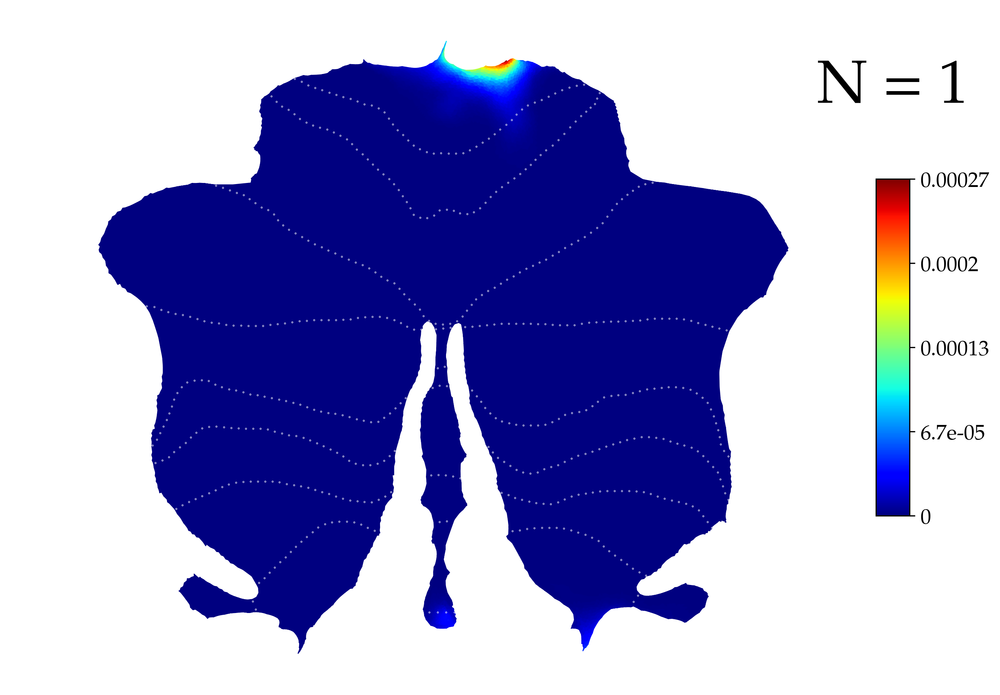

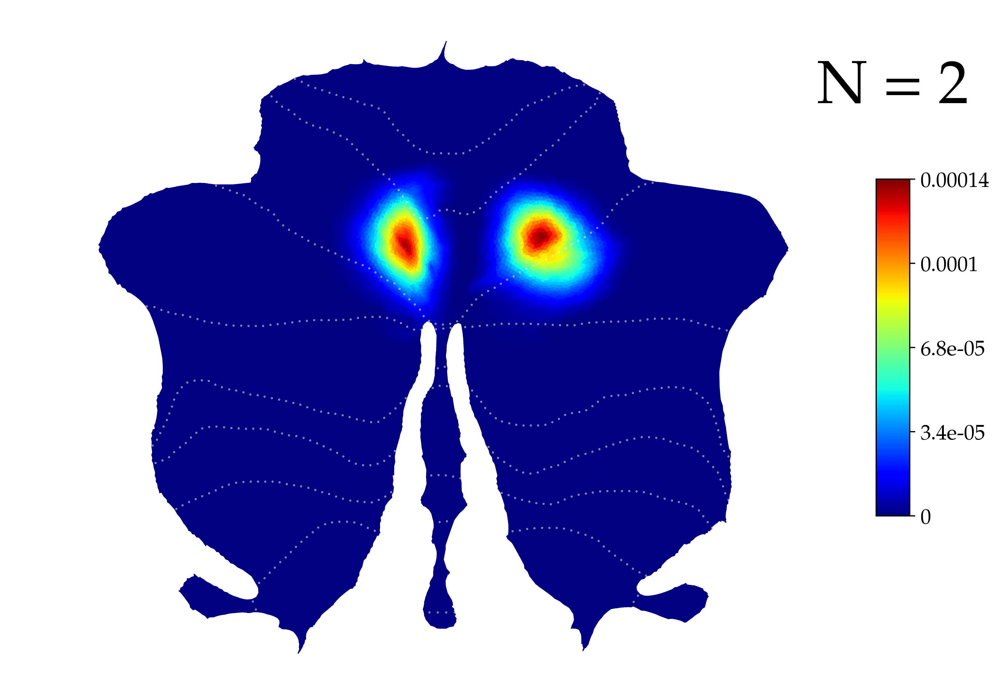

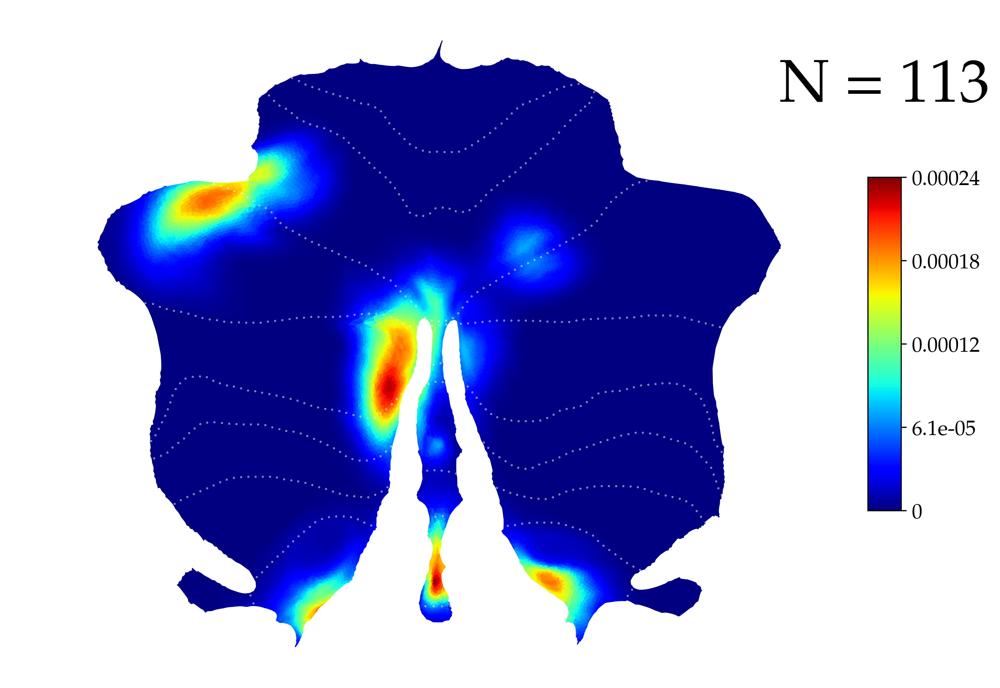

In [6]:
example_ma_flatmaps = []
for ma_idx in [0, 1, ale.ma_values.shape[0]-1]:
    # Create a new figure for each flatmap
    fig = plt.figure(figsize=(12, 8))  # Adjust the size as needed

    ma_img = nilearn.image.new_img_like(ale.masker.mask_img, ale.ma_values[ma_idx].todense())
    flatmap = SUITPy.flatmap.vol_to_surf(ma_img, 'SPM').squeeze()
    example_ma_flatmaps.append(flatmap)
    display(
        SUITPy.flatmap.plot(
            flatmap,
            colorbar=True, new_figure=False, bordersize=0.5,
            bordercolor='white'
        )
    )
    # set title
    plt.title(f"N = {ma_idx+1}", fontsize=40, y=1.2)

### ALE map

<AxesSubplot: >

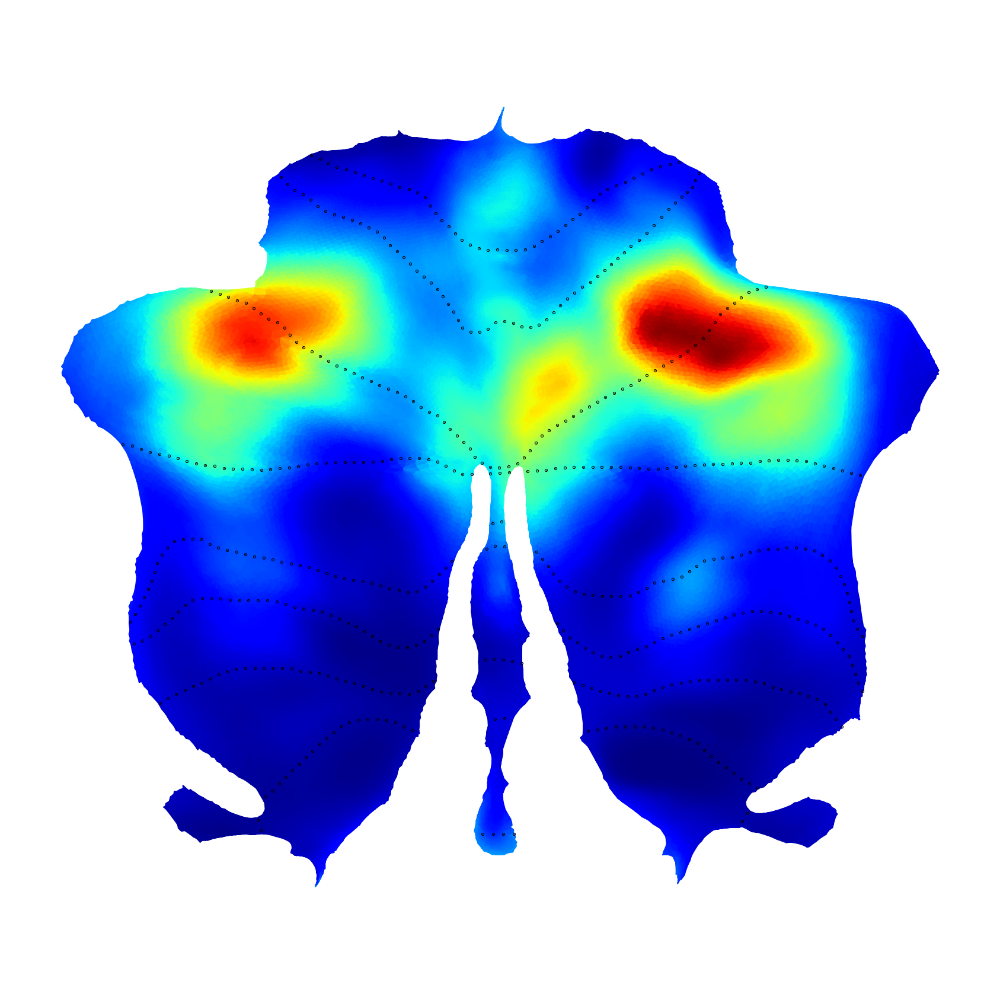

In [7]:
ale_flatmap = SUITPy.flatmap.vol_to_surf(ale_res.get_map('stat'), 'SPM').squeeze()
display(
    SUITPy.flatmap.plot(
        ale_flatmap,
        colorbar=False, new_figure=True, bordersize=0.5
    )
)

## Classic ALE

### Sampling probability map

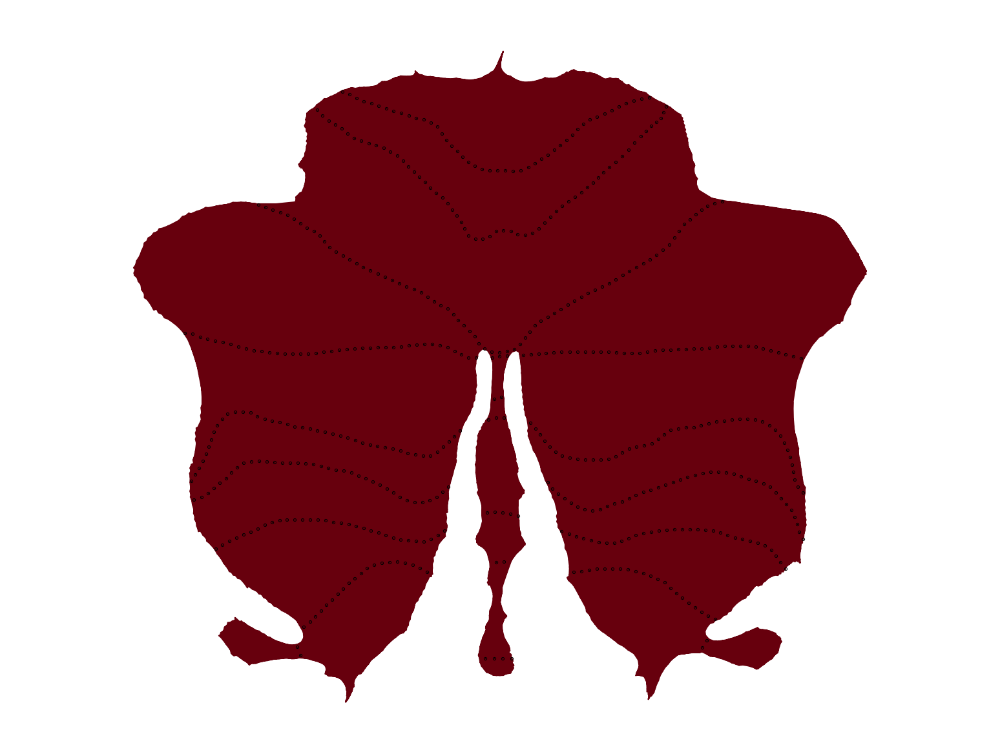

In [8]:
# Hacky workaround to make a flat-colored cerebellar cerebellar flatmap.
# Extract the top color from the 'Reds' colormap
top_color = plt.cm.Reds(1.0)

# Create a custom colormap with the top color on both ends
cmap = mcolors.LinearSegmentedColormap.from_list('custom_reds', [top_color, top_color], N=256)

# Generate the map of a constant value
sampling_prob_surf_ale = np.full_like(ale_flatmap, 0.99)
# Assign first vertex to 0.98
sampling_prob_surf_ale[0] = 0.98

# Plot the flatmap using the custom colormap
SUITPy.flatmap.plot(sampling_prob_surf_ale, colorbar=False, new_figure=False, bordersize=0.5, cmap=cmap)

### Histogram

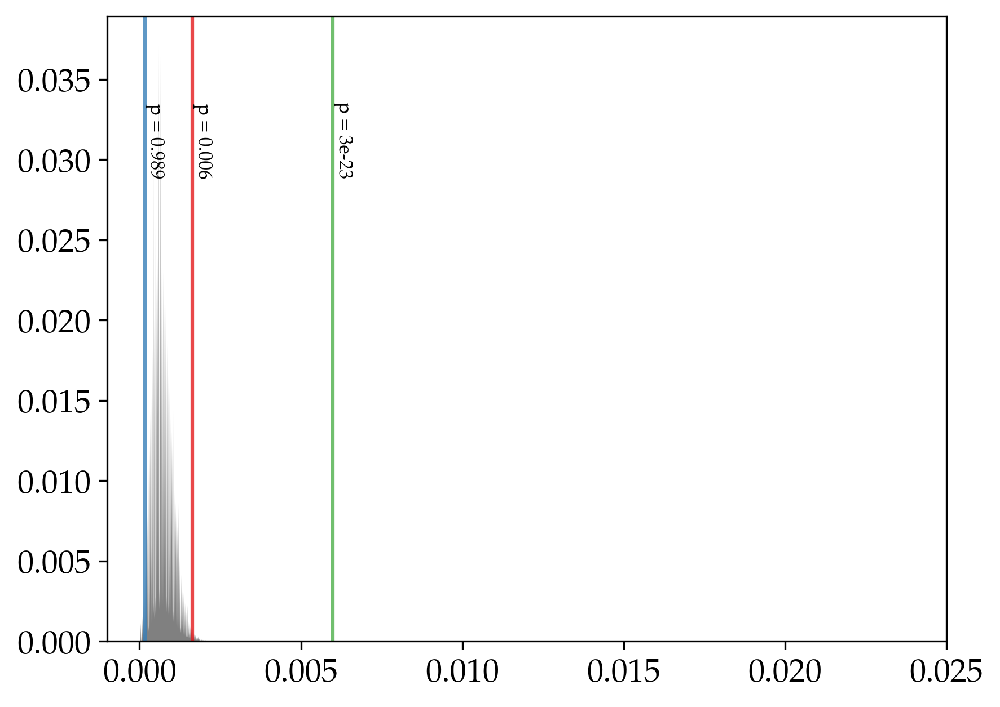

In [9]:
# select example voxels including 2 random voxels
# and the voxel with maximum stat (all falling within
# the proper mask)
np.random.seed(4)
proper_mask = nibabel.load(os.path.join(INPUT_DIR, 'maps', 'D2009_MNI.nii.gz'))
proper_mask_flat = mask.fit_transform(proper_mask).squeeze()
proper_mask_flat /= proper_mask_flat.sum()
voxels = {
    'Random': np.random.choice(np.arange(proper_mask_flat.size), p=proper_mask_flat),
    'Random 2': np.random.choice(np.arange(proper_mask_flat.size), p=proper_mask_flat),
    'Max stat': (ale_res.maps['stat'] * proper_mask_flat).argmax(),
}
# set their colors
colors = sns.color_palette('Set1', len(voxels))
# plot ALE approximate histogram
fig, ax = plt.subplots()
ale_bins = ale_res.estimator.null_distributions_['histogram_bins']
hist = ale_res.estimator.null_distributions_['histweights_corr-none_method-approximate']
ax.fill_between(ale_bins, hist, y2=0, where=hist>0, facecolor='grey', edgecolor='none', alpha=1.0)
# plot observed ALE values of selected voxels
hist_step = ale_bins[1] - ale_bins[0]
for i, (label, vox) in enumerate(voxels.items()):
    ax.axvline(ale_res.maps['stat'][vox], color=colors[i], alpha=0.8)
    p = nullhist_to_p(ale_res.maps['stat'][vox], hist, ale_bins)
    if p < 0.001:
        p_text = f'p = {p:.0e}'
    else:
        p_text = f'p = {p:.3f}'
    ax.annotate(p_text, xy=(ale_res.maps['stat'][vox]+hist_step, ax.get_ylim()[1]*0.75), fontsize=8, rotation=-90)

ax.set_ylim(0, ax.get_ylim()[1])
ax.set_xlim([-0.001, 0.025])


## C-SALE

Run it:

In [15]:
PROB_MAP_PATH = utils.get_kernels_sum(os.path.join(OUTPUT_DIR, 'data', 'BrainMap_dump_Feb2024.pkl.gz'))
prob_map = nibabel.load(PROB_MAP_PATH)
sale = DeviceSCALE(
    'probabilistic',
    prob_map=prob_map,
    xyz=None,
    mask=mask, 
    n_iters=10000,
    nbits=64,
    keep_perm_nulls=True,
    keep_voxel_hists=True,
    sigma_scale=1.0,
    use_mmap=False,
    batch_size=10,
)
sale_res = sale.fit(dset)

### Sampling probability map

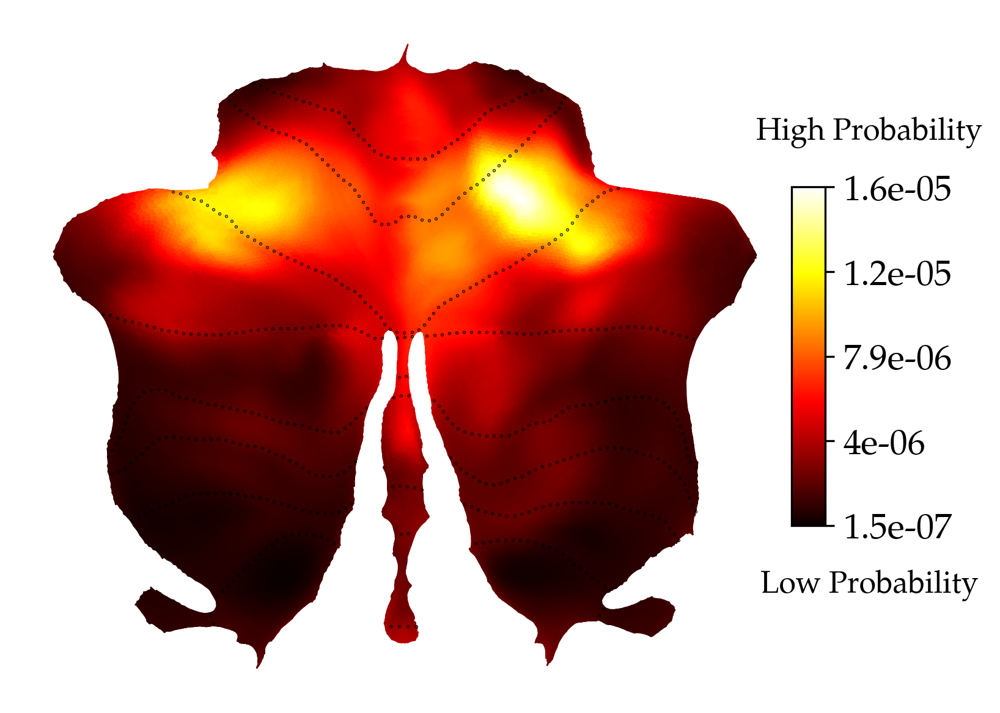

In [17]:
sampling_prob_img = mask.inverse_transform(sale.sampling_prob)
sampling_prob_surf = SUITPy.flatmap.vol_to_surf(sampling_prob_img, space = 'SPM').squeeze()
SUITPy.flatmap.plot(sampling_prob_surf, colorbar=True, new_figure=False, bordersize=0.5, cmap='hot')

# Get the current figure and axis
fig = plt.gcf()
ax = plt.gca()

fig.text(0.85, 0.235, 'Low Probability', va='center', ha='center', fontsize=12, fontweight='extra bold')
fig.text(0.85, 0.75, 'High Probability', va='center', ha='center', fontsize=12, fontweight='extra bold')

### Example null ALE maps

<AxesSubplot: >

<AxesSubplot: >

<AxesSubplot: >

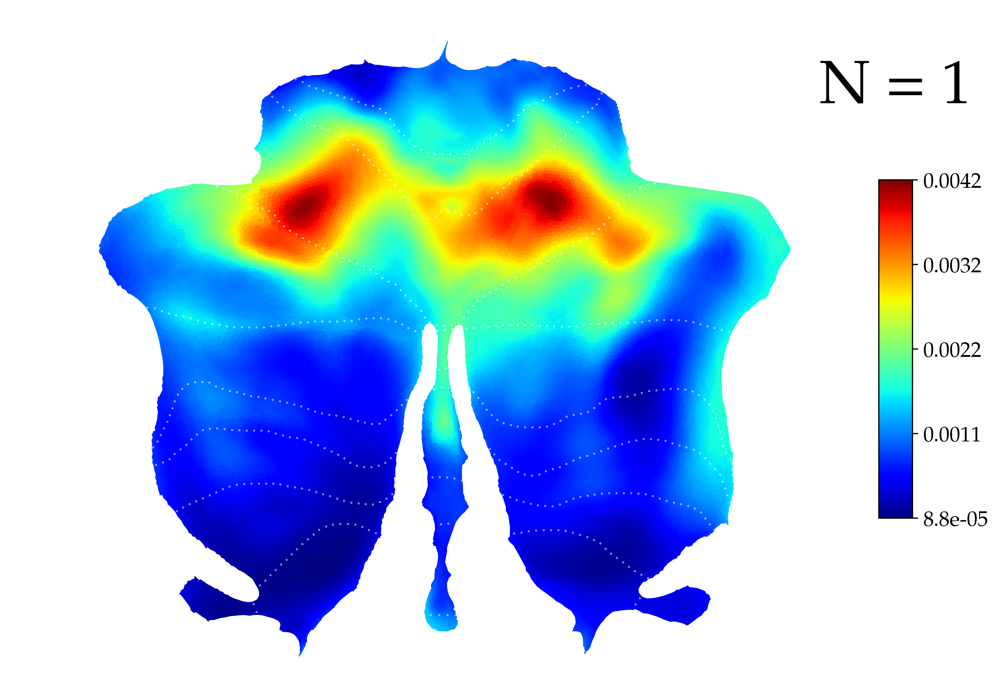

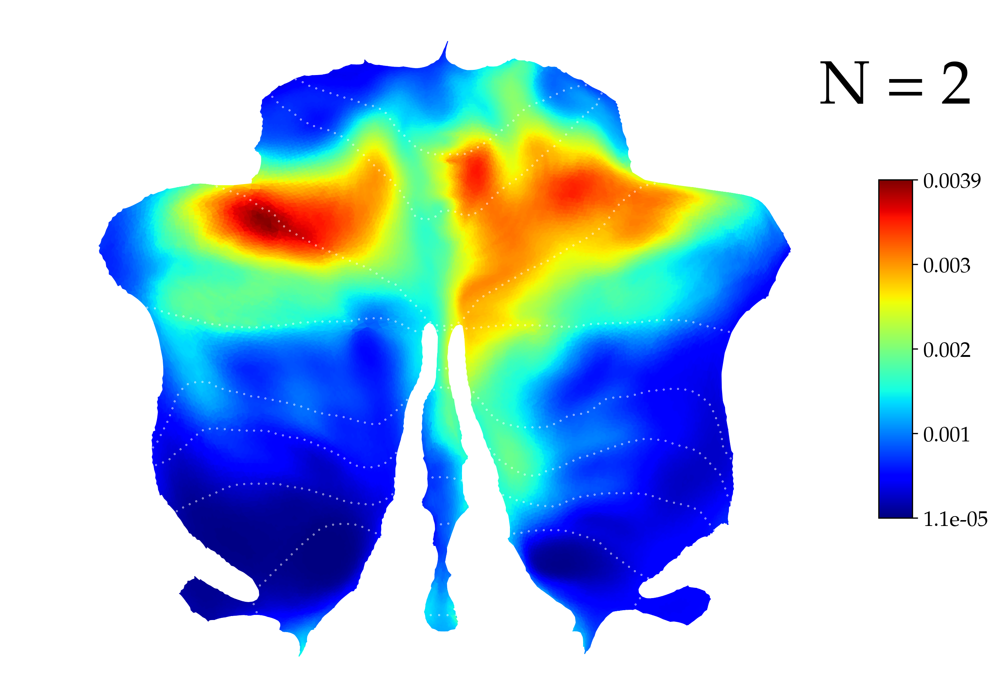

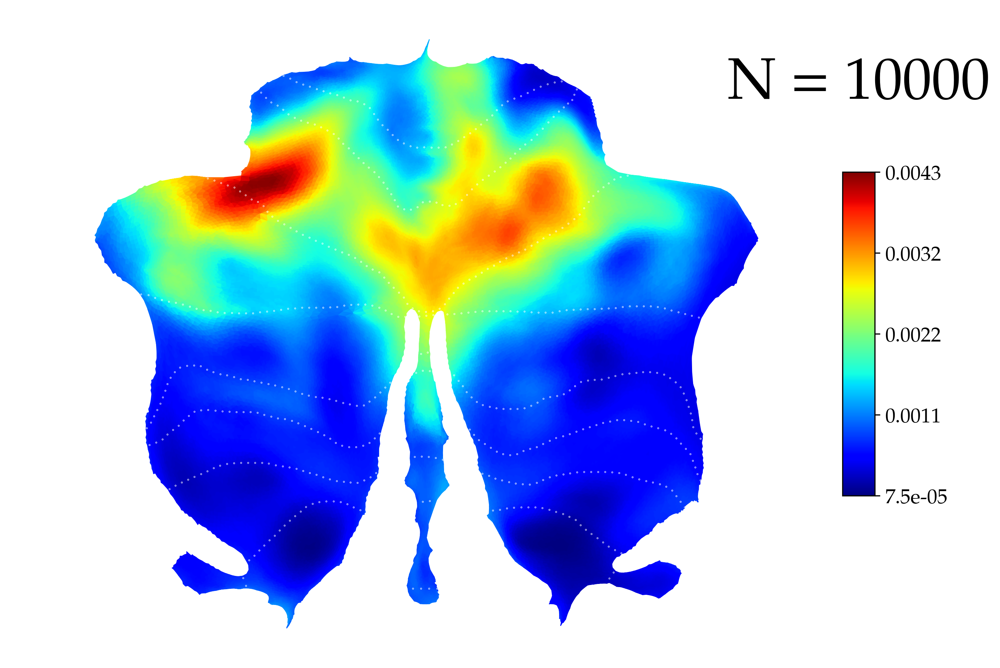

In [18]:
example_null_flatmaps = []
for null_idx in [0, 1, 2, 9999]:
    # Create a new figure for each flatmap
    fig = plt.figure(figsize=(12, 8))  # Adjust the size as needed
    null_img = sale.masker.inverse_transform(sale.null_distributions_['perm_scale_values'][null_idx,:])
    flatmap = SUITPy.flatmap.vol_to_surf(null_img, 'SPM').squeeze()
    example_null_flatmaps.append(flatmap)
    display(
        SUITPy.flatmap.plot(
            flatmap,
            colorbar=True, new_figure=False, bordersize=0.5,
            bordercolor='white'
        )
    )
    # set title
    plt.title(f"N = {null_idx+1}", fontsize=40, y=1.2)

### Histogram

(-0.001, 0.025)

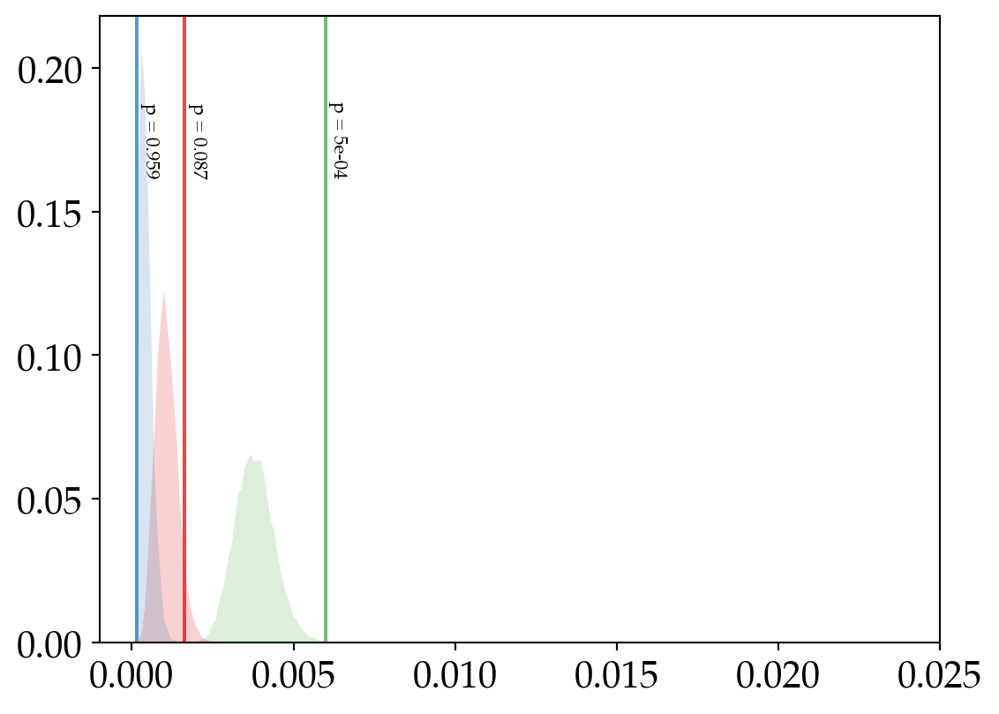

In [128]:
# normalize voxel-wise histograms to a sum of 1 (for the histogram of each voxel)
voxel_hists_norm = sale.null_distributions_['voxel_hists'] / sale.null_distributions_['voxel_hists'].sum(axis=1, keepdims=True)
# get histogram bins
psale_bins = sale.null_distributions_['histogram_bins']


fig, ax = plt.subplots()
# plot histograms
for i, (_, vox) in enumerate(voxels.items()):
    hist = voxel_hists_norm[vox]
    ax.fill_between(psale_bins, hist, y2=0, where=hist>0, facecolor=colors[i], edgecolor='none', alpha=0.2)
# plot voxel observed values in ALE map
for i, (_, vox) in enumerate(voxels.items()):
    hist = voxel_hists_norm[vox]
    p = nullhist_to_p(sale_res.maps['stat'][vox], hist, psale_bins)
    if p < 0.001:
        p_text = f'p = {p:.0e}'
    else:
        p_text = f'p = {p:.3f}'
    hist_step = psale_bins[1] - psale_bins[0]
    ax.annotate(p_text, xy=(sale_res.maps['stat'][vox]+hist_step, ax.get_ylim()[1]*0.75), fontsize=8, rotation=-90)
    ax.axvline(sale_res.maps['stat'][vox], color=colors[i], alpha=0.8)

ax.set_ylim(0, ax.get_ylim()[1])

ax.set_xlim([-0.001, 0.025])

# S18. Comparison of GPU and CPU performance in running meta-analyses

Load the scaling data from JSONs (created via `../run_scaling.py`) or the pre-curated CSV file from these JSON files:

In [4]:
csv_path = os.path.join(OUTPUT_DIR, 'scaling_data.csv')
if os.path.exists(csv_path):
    data = pd.read_csv(csv_path, index_col=0)
else:
    # collect jsons data into a dataframe
    data = []
    for json_file in sorted(glob.glob(os.path.join(OUTPUT_DIR, 'scaling_jsons', '*.json'))):
        with open(json_file, 'r') as f:
            scaling_data.append(json.load(f))
    data = pd.DataFrame(data)
    # cleaning
    data['analysis'] = data['analysis'].replace({'ale': 'ALE', 'dsale': 'dSALE', 'psale': 'pSALE'})
    data['hardware'] = data['hardware'].str.upper()
    # drop duplicates (on GPU 100-100 is done twice)
    data = data.drop_duplicates(['n_exp', 'n_iters', 'analysis', 'hardware']).reset_index(drop=True)
    data.to_csv(csv_path)
data

,n_exp,n_iters,duration,hardware,analysis
0,1000,100,2521.040596,CPU,ALE
1,100,10,25.889527,CPU,ALE
2,100,100,199.907081,CPU,ALE
3,100,1000,2745.139689,CPU,ALE
4,100,10000,17465.595773,CPU,ALE
...,...,...,...,...,...
60,900,100,27.328158,GPU,pSALE
61,1000,100,30.942258,GPU,pSALE
62,100,10,5.102689,GPU,pSALE
63,100,1000,18.231861,GPU,pSALE


In [5]:
# make a wide df for comparison of CPU (NiMARE) and GPU (nimare-gpu)
# in running ALE and deterministic SALE implemented in both
data_wide = []
for (n_exp, n_iters, analysis), df in data.groupby(['n_exp', 'n_iters', 'analysis']):
    if analysis == 'pSALE':
        # probabilistic SALE does not have CPU time as it is not implemented in NiMARE
        continue
    data_wide.append({
        'analysis': analysis,
        'n_exp': n_exp,
        'n_iters': n_iters,
        'cpu': df.loc[df['hardware']=='CPU', 'duration'].values[0],
        'gpu': df.loc[df['hardware']=='GPU', 'duration'].values[0],
    })
data_wide = pd.DataFrame(data_wide)
# calculate CPU to GPU ratio
data_wide['cpu_gpu_ratio'] = data_wide['cpu'] / data_wide['gpu']

## Scaling number of experiments

In [6]:
plt.rcParams["font.size"] = 16
plt.rcParams["figure.dpi"] = 192

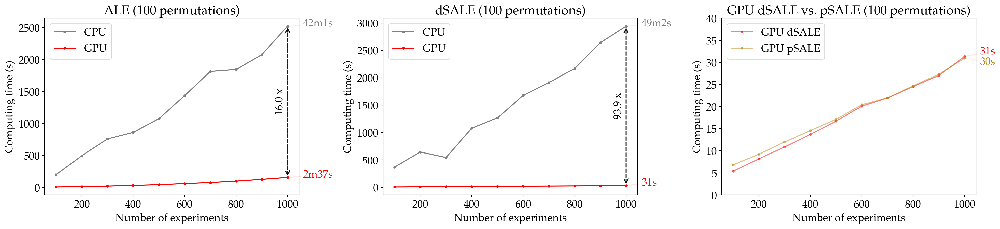

In [7]:
fig, axes = plt.subplots(1, 3, figsize=(21, 5))

for i, analysis in enumerate(['ALE', 'dSALE']):
    # ALE and dSALE plots
    ax = axes[i]
    plot_data = data_wide.loc[
        (data_wide['n_iters'] == 100) &
        (data_wide['analysis'] == analysis)
    ]
    colors = colors_text = ['grey', 'red']
    max_times = {}
    for j, hardware in enumerate(['CPU', 'GPU']):
        # line plot
        ax.plot(
            plot_data['n_exp'], 
            plot_data[hardware.lower()],
            label=hardware,
            ls='-',
            marker='.',
            color=colors[j],
        )
        # max time annotation
        max_time = plot_data.loc[plot_data['n_exp'] == 1000, hardware.lower()].values[0]
        max_times[hardware] = max_time
        ax.annotate(
            utils.seconds_to_str(max_time), xy=(1000, max_time), xytext=(1060, max_time),
            color=colors_text[j], fontsize=16,
            arrowprops=dict(arrowstyle='-', color=colors_text[j], lw=1.5, alpha=0.1)
        )
    # plot vertical arrow of speed up
    max_speedup = max_times['CPU'] / max_times['GPU']
    middle_point = (max_times['CPU']+max_times['GPU'])/2
    # arrow
    ax.annotate(
        '', xy=(1000, max_times['CPU']), xytext=(1000, max_times['GPU']),
        arrowprops=dict(arrowstyle='<->', ls='--', color='black', lw=1.5, alpha=0.9)  # Two-way arrow
    )
    # text
    ax.annotate(
        f'{max_speedup:.1f} x', xy=(1000, middle_point), xytext=(950, middle_point),
        fontsize=16, color='black', rotation='vertical', ha='left', va='center',
    )

    ax.set_ylabel('Computing time (s)')
    ax.set_xlabel('Number of experiments')
    ax.set_title(f'{analysis} (100 permutations)')
    ax.legend()

# Third plot: Focus only on GPU dSALE vs pSALE
ax = axes[2]
colors = ['red', 'darkgoldenrod']
offsets = [+0.5, -1.5] 
for i, analysis in enumerate(['dSALE', 'pSALE']):
    plot_data = data.loc[
        (data['hardware'] == 'GPU') &
        (data['n_iters'] == 100) &
        (data['analysis'] == analysis)
    ].drop_duplicates('n_exp')
    # line plot
    ax.plot(
        plot_data['n_exp'], 
        plot_data['duration'],
        label=f'GPU {analysis}',
        ls='-',
        marker='.',
        color=colors[i],
        alpha=0.5
    )
    # max time annotation
    max_time = plot_data.loc[plot_data['n_exp'] == 1000, 'duration'].values[0]
    ax.annotate(
        utils.seconds_to_str(max_time), xy=(1000, max_time), xytext=(1060, max_time + offsets[i]),
        color=colors[i], fontsize=16,
        arrowprops=dict(arrowstyle='-', color=colors[i], lw=1.5, alpha=0.1)
    )
ax.set_ylim([0, 40])
ax.set_ylabel('Computing time (s)')
ax.set_xlabel('Number of experiments')
ax.set_title('GPU dSALE vs. pSALE (100 permutations)')
ax.legend()


plt.tight_layout(pad=1)

## Scaling number of iterations

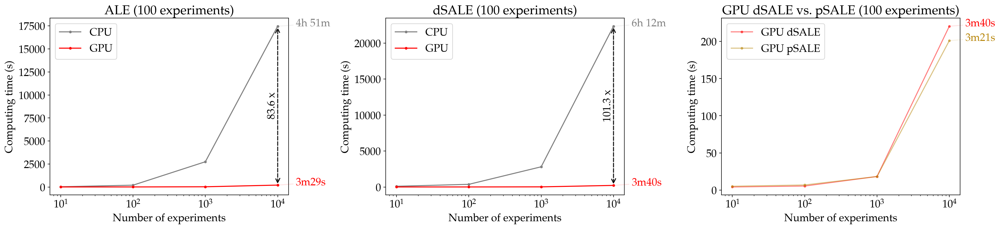

In [8]:
fig, axes = plt.subplots(1, 3, figsize=(21, 5))

for i, analysis in enumerate(['ALE', 'dSALE']):
    # ALE and dSALE plots
    ax = axes[i]
    plot_data = data_wide.loc[
        (data_wide['n_exp'] == 100) &
        (data_wide['analysis'] == analysis)
    ]
    colors = colors_text = ['grey', 'red']
    max_times = {}
    for j, hardware in enumerate(['CPU', 'GPU']):
        # line plot
        ax.plot(
            plot_data['n_iters'], 
            plot_data[hardware.lower()],
            label=hardware,
            ls='-',
            marker='.',
            color=colors[j],
        )
        ax.set_xscale('log')
        # max time annotation
        max_time = plot_data.loc[plot_data['n_iters'] == 10000, hardware.lower()].values[0]
        max_times[hardware] = max_time
        x_text = 10**(np.log10(ax.get_xlim()[1]) + 0.1)
        ax.annotate(
            utils.seconds_to_str(max_time), xy=(10000, max_time), xytext=(x_text, max_time),
            color=colors_text[j], fontsize=16,
            arrowprops=dict(arrowstyle='-', color=colors_text[j], lw=1.5, alpha=0.1)
        )
    # plot vertical arrow of speed up
    max_speedup = max_times['CPU'] / max_times['GPU']
    middle_point = (max_times['CPU']+max_times['GPU'])/2
    # arrow
    ax.annotate(
        '', xy=(10000, max_times['CPU']), xytext=(10000, max_times['GPU']),
        arrowprops=dict(arrowstyle='<->', ls='--', color='black', lw=1.5, alpha=0.9)  # Two-way arrow
    )
    # text
    x_text = 10**(4 - 0.15)
    ax.annotate(
        f'{max_speedup:.1f} x', xy=(10000, middle_point), xytext=(x_text, middle_point),
        fontsize=16, color='black', rotation='vertical', ha='left', va='center',
    )
    ax.set_ylabel('Computing time (s)')
    ax.set_xlabel('Number of experiments')
    ax.set_title(f'{analysis} (100 experiments)')
    ax.legend()

# Third plot: Focus only on GPU dSALE vs pSALE
ax = axes[2]
colors = ['red', 'darkgoldenrod']
for i, analysis in enumerate(['dSALE', 'pSALE']):
    plot_data = data.loc[
        (data['hardware'] == 'GPU') &
        (data['n_exp'] == 100) &
        (data['analysis'] == analysis)
    ].drop_duplicates('n_iters').sort_values('n_iters')
    # line plot
    ax.plot(
        plot_data['n_iters'], 
        plot_data['duration'],
        label=f'GPU {analysis}',
        ls='-',
        marker='.',
        color=colors[i],
        alpha=0.5
    )
    # max time annotation
    max_time = plot_data.loc[plot_data['n_iters'] == 10000, 'duration'].values[0]
    x_text = 10**(np.log10(ax.get_xlim()[1]) + 0.2)
    ax.annotate(
        utils.seconds_to_str(max_time), xy=(10000, max_time), xytext=(x_text, max_time),
        color=colors[i], fontsize=16,
        arrowprops=dict(arrowstyle='-', color=colors[i], lw=1.5, alpha=0.1)
    )
ax.set_xscale('log')
ax.set_ylabel('Computing time (s)')
ax.set_xlabel('Number of experiments')
ax.set_title('GPU dSALE vs. pSALE (100 experiments)')
ax.legend()


plt.tight_layout(pad=1)